# King County Housing
#### House Price Estimate

**Authors:** Hatice Kastan, Czarina Luna, Ross McKim, Weston Shuken

##### January 2022

***

![image](Images/daria-nepriakhina-LZkbXfzJK4M-unsplash.jpg)

## Overview

    Overview of our project.

## Business Problem

    Stakeholder is a real estate company.
    Business Problem is predicting price and building a house price calculator.

## Data Understanding
    Describe the data being used for this project.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import RFE
from pandas.api.types import is_numeric_dtype
from sklearn.preprocessing import PolynomialFeatures

In [2]:
raw_data = pd.read_csv('Data/kc_house_data.csv')
raw_data.head(2)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,...,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,...,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639


## Data Cleaning
    Describe and justify the process for preparing the data for analysis.

In [3]:
# Data prep and cleaning
clean_data = raw_data.copy()

# Change to datetime and add month column
clean_data['date'] = pd.to_datetime(clean_data['date'])
clean_data['month'] = pd.DatetimeIndex(clean_data['date']).month

# Change waterfront missing value to No
clean_data.loc[raw_data.waterfront.isnull(), 'waterfront'] = 'NO'
clean_data['waterfront'] = clean_data['waterfront'].apply(lambda x: 0 if x == 'NO' else 1)

# Change view missing value to None
clean_data.loc[raw_data.view.isnull(), 'view'] = "NONE"
view_dict = {'NONE':0, 'FAIR':1, 'AVERAGE':2, 'GOOD':3, 'EXCELLENT':4}
clean_data['view'].replace(view_dict, inplace=True)

# Change condition to numerical value
cond_dict = {'Poor':0, 'Fair':1, 'Average':2, 'Good':3, 'Very Good':4}
clean_data['condition'].replace(cond_dict, inplace=True)

# Change grade to numerical value
clean_data['grade'] = clean_data['grade'].map(lambda x: int(x.split(' ')[0]))

# Add has_basement column
clean_data['sqft_basement'] = clean_data['sqft_basement'].replace('?', '0').astype('float')
clean_data['basement'] = clean_data['sqft_basement'].apply(lambda x: 0 if x == 0 else 1)

# Change some yr_renovated missing value to 0 and add renovated column
clean_data.loc[raw_data.yr_renovated.isnull(), 'yr_renovated'] = 0
clean_data['renovated'] = clean_data['yr_renovated'].apply(lambda x: 0 if x == 0 else 1)

# Add house_age column
clean_data['age'] = clean_data['date'].dt.year - clean_data['yr_built']

In [ ]:
clean_data = clean_data[(clean_data.price < clean_data.price.quantile(.995)) 
                        & (clean_data.price > clean_data.price.quantile(.005))]

In [4]:
def corr_check(df, threshold):
    '''
    Enter dataframe and threshold for correlation
    Returns table of the highly correlated pairs
    '''
    corr_df = df.corr().abs().stack().reset_index().sort_values(0, ascending=False)
    corr_df['pairs'] = list(zip(corr_df.level_0, corr_df.level_1))
    corr_df.set_index(['pairs'], inplace = True)
    corr_df.drop(columns=['level_1', 'level_0'], inplace = True)
    corr_df.columns = ['cc']
    corr_df = corr_df.drop_duplicates()
    corr_df = corr_df[(corr_df['cc'] > threshold) & (corr_df['cc'] < 1)]
    return corr_df

corr_check(clean_data, .7)

,cc
pairs,
"(yr_renovated, renovated)",0.999968
"(yr_built, age)",0.999873
"(sqft_living, sqft_above)",0.876448
"(basement, sqft_basement)",0.820893
"(grade, sqft_living)",0.762779
"(sqft_living15, sqft_living)",0.756402
"(grade, sqft_above)",0.756073
"(bathrooms, sqft_living)",0.755758
"(sqft_living15, sqft_above)",0.731767


In [5]:
# Drop columns
clean_data = clean_data.drop(columns=['id', 'date', 'yr_renovated', 'sqft_above', 'sqft_basement',
                      'yr_built', 'yr_renovated'])

In [6]:
clean_data.head(2)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,zipcode,lat,long,sqft_living15,sqft_lot15,month,basement,renovated,age
0,221900.0,3,1.00,1180,5650,1.0,0,0,2,7,98178,47.5112,-122.257,1340,5650,10,0,0,59
1,538000.0,3,2.25,2570,7242,2.0,0,0,2,7,98125,47.7210,-122.319,1690,7639,12,1,1,63


In [7]:
corr_check(clean_data, .7)

,cc
pairs,
"(sqft_living, grade)",0.762779
"(sqft_living15, sqft_living)",0.756402
"(bathrooms, sqft_living)",0.755758
"(sqft_lot, sqft_lot15)",0.718204
"(sqft_living15, grade)",0.713867
"(sqft_living, price)",0.701917


## Data Exploration
    Generate insights and visualizations about price and its relationships with variables.

In [8]:
clean_data.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,zipcode,lat,long,sqft_living15,sqft_lot15,month,basement,renovated,age
count,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.00000,21597.000000,21597.000000
mean,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.006760,0.233181,2.409825,7.657915,98077.951845,47.560093,-122.213982,1986.620318,12758.283512,6.573969,0.38510,0.034449,43.323286
std,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.081944,0.764673,0.650546,1.173200,53.513072,0.138552,0.140724,685.230472,27274.441950,3.115061,0.48663,0.182384,29.377285
min,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,0.000000,3.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,1.000000,0.00000,0.000000,-1.000000
25%,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,2.000000,7.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000,4.000000,0.00000,0.000000,18.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,2.000000,7.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000,6.000000,0.00000,0.000000,40.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,3.000000,8.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,9.000000,1.00000,0.000000,63.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,4.000000,13.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,12.000000,1.00000,1.000000,115.000000


In [9]:
clean_data.loc[(clean_data.bedrooms == 33), 'bedrooms'] = 3

In [10]:
import geopandas as gpd
from shapely.geometry import Point, Polygon

street_map = gpd.read_file('Map/Incorporated_Areas_of_King_County___city_area.shp')

def map_data(data, title):
    geometry = [Point(xy) for xy in zip(data['long'], data['lat'])]
    geo_df = gpd.GeoDataFrame(data, crs = 'EPSG:4326', geometry = geometry)
    
    fig, ax = plt.subplots(figsize=(15,15))
    street_map.plot(ax=ax, alpha=0.4, color='grey')
    geo_df.plot(column='price', ax=ax, alpha=0.4, legend=True, markersize=10, cmap=plt.get_cmap('jet'))

    plt.title(title, fontsize=15,fontweight='bold')
    plt.xlim(data.long.min(), data.long.max())
    plt.ylim(data.lat.min(), data.lat.max())
    plt.show()

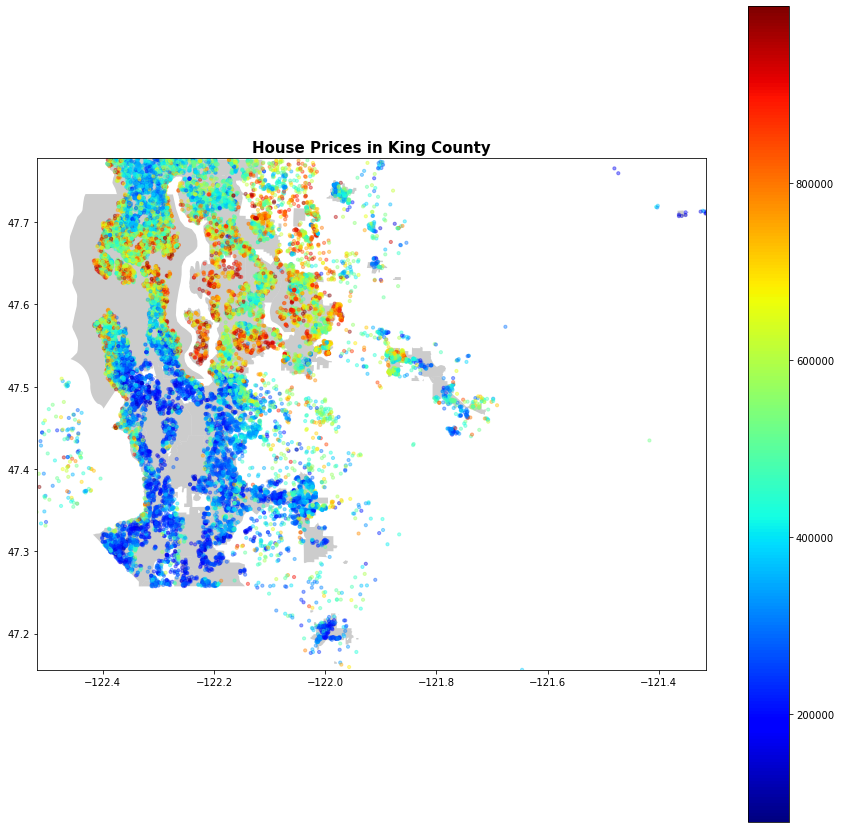

In [11]:
non_million_data = clean_data.loc[(clean_data.price < 1_000_000)]
million_data = clean_data.loc[(clean_data.price >= 1_000_000)]

map_data(non_million_data, 'House Prices in King County')

In [12]:
import folium as folium

kc_geo = 'Map/Zipcodes_for_King_County_and_Surrounding_Area___zipcode_area.geojson'

m = folium.Map(location=[47.484823, -122.112342], tiles="cartodbpositron", zoom_start=9.5)

folium.Choropleth(
    geo_data=kc_geo,
    data=non_million_data,
    columns=['zipcode', 'price'],
    key_on='feature.properties.ZIP',
    fill_color='PuBuGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Sale Prices (Under a Million)').add_to(m)

folium.LayerControl().add_to(m)

m

In [13]:
kc_geo = 'Map/Zipcodes_for_King_County_and_Surrounding_Area___zipcode_area.geojson'

m = folium.Map(location=[47.484823, -122.112342], tiles="cartodbpositron", zoom_start=9.5)

folium.Choropleth(
    geo_data=kc_geo,
    data=million_data,
    columns=['zipcode', 'price'],
    key_on='feature.properties.ZIP',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='House Sale Prices (Over a Million)').add_to(m)

folium.LayerControl().add_to(m)

m

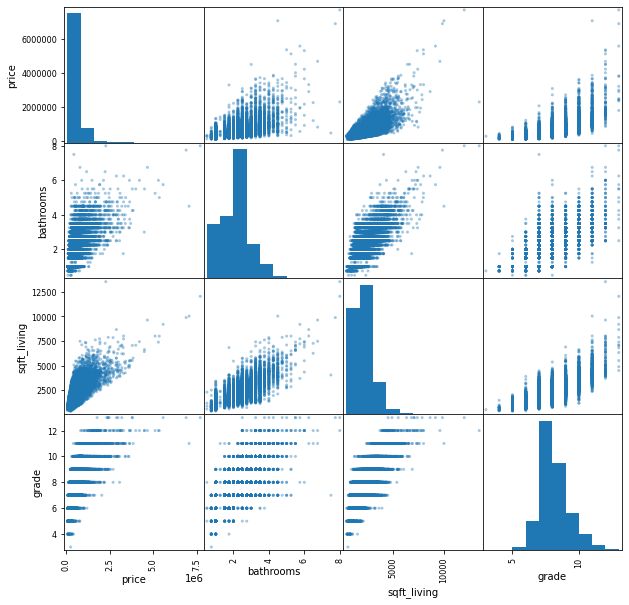

In [14]:
attributes = ['price', 'bathrooms', 'sqft_living', 'grade']

pd.plotting.scatter_matrix(clean_data[attributes], figsize = [10, 10], alpha=0.4);
plt.show()

## Data Modeling
    Describe and justify the process for modeling the data.
    Run multiple linear regression on top ranking features.

In [15]:
lr = LinearRegression()

In [16]:
# Our model needs to have only numeric variables.
def only_numeric(data):
    '''returns a dataframe with only numeric values'''
    for column in data.columns:
        if is_numeric_dtype(data[column]) == False:
            data = data.drop(column, axis=1)
        else:
            continue
    return data

In [17]:
#Splits a dataframe into X and Y dataframes given a target column.
def get_y_X(data, target):
    y = data[target] 
    X = data.drop(target, axis=1)
    return y, X

In [18]:
def model_summary(y, X):
    model = sm.OLS(y, sm.add_constant(X)).fit()
    return model.summary()

In [19]:
def get_metrics(X_tr, X_te, y_tr, y_te):
    lr.fit(X_tr, y_tr)
    
    train_score = lr.score(X_tr, y_tr)
    test_score = lr.score(X_te, y_te)
    
    y_hat_train = lr.predict(X_tr)
    y_hat_test = lr.predict(X_te)
    
    train_rmse = np.sqrt(mean_squared_error(y_tr, y_hat_train))
    test_rmse = np.sqrt(mean_squared_error(y_te, y_hat_test))
    
    return train_score, test_score, train_rmse, test_rmse

In [20]:
def train_test_compare(X_tr, X_te, y_tr, y_te):
    lr.fit(X_tr, y_tr)
    
    train_score = lr.score(X_tr, y_tr)
    test_score = lr.score(X_te, y_te)
    
    y_hat_train = lr.predict(X_tr)
    y_hat_test = lr.predict(X_te)
    
    train_rmse = np.sqrt(mean_squared_error(y_tr, y_hat_train))
    test_rmse = np.sqrt(mean_squared_error(y_te, y_hat_test))
    
    print(f' training data R2: {train_score}\n testing data R2: {test_score} \
                    \n training data rmse: {train_rmse}\n testing data rmse: {test_rmse}')
    
    stats_summ = input('Do you want a statsmodel summary of the train data? (y/n)')
    if stats_summ == 'y':
        inter = lr.intercept_
        stats = sm.OLS(y_tr, sm.add_constant(X_tr)).fit()
        summary = stats.summary()
        print(summary)
    
    return
    

In [21]:
def all_in_one(train, test, target):
    y_tr, X_tr = get_y_X(train, target)
    y_te, X_te = get_y_X(test, target)
    
    return train_test_compare(X_tr, X_te, y_tr, y_te)

## Train Test Split
    Split the raw data to a train and test set.

In [22]:
def train_test(data, size=.25):
    train_set, test_set = train_test_split(data, test_size=size, random_state=42)
    return train_set, test_set

In [23]:
train_set, test_set = train_test(clean_data, .25)

In [24]:
baseline = only_numeric(raw_data)
baseline = baseline.dropna()

In [25]:
baseline = raw_data.drop(columns=['date', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement']).dropna()

In [26]:
baseline_train_set, baseline_test_set = train_test(baseline, .25)

### Baseline Model
    Run simple linear regression on feature highest correlated with price.

In [27]:
y_train, X_train = get_y_X(baseline_train_set, 'price')
y_test, X_test = get_y_X(baseline_test_set, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.6319749427235022
 testing data R2: 0.6181910518761328                     
 training data rmse: 226292.82659600402
 testing data rmse: 221129.32483151313
Do you want a statsmodel summary of the train data? (y/n)


In [28]:
get_metrics(X_train, X_test, y_train, y_test)

(0.6319749427235022,
 0.6181910518761328,
 226292.82659600402,
 221129.32483151313)

##### Model Metrics Table
    Create table of metrics we care about, and update with every additional model after.

In [29]:
metric_table = pd.DataFrame(columns = ['model', 'train_rsquared', 'test_rsquared', 'train_rmse', 'test_rmse'])

In [30]:
def update_metrics(model_name, X_tr, X_te, y_tr, y_te):
    train_score, test_score, train_rmse, test_rmse = get_metrics(X_tr, X_te, y_tr, y_te)
    return metric_table.append({'model': model_name, 'train_rsquared': train_score, 
                                'test_rsquared': test_score, 'train_rmse': train_rmse, 
                                'test_rmse': test_rmse}, ignore_index = True)

In [31]:
metric_table = update_metrics('Baseline Data', X_train, X_test, y_train, y_test)
metric_table

,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832


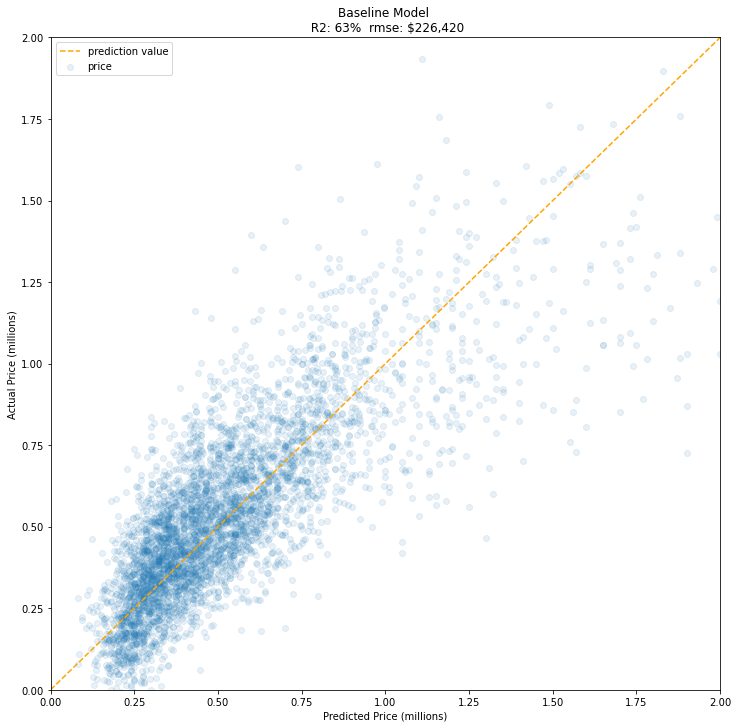

In [33]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots(figsize=(12,12))
perfect_line = np.arange(0, 3)
ax.plot(perfect_line, linestyle="--", color="orange", label='prediction value')
ax.scatter(y_test/1000000, y_hat/1000000, alpha=0.1, label='price')
plt.xlim(0, 2)
plt.ylim(0, 2)
ax.set_xlabel("Predicted Price (millions)")
ax.set_ylabel("Actual Price (millions)")
ax.set_title("Baseline Model \n R2: 63%  rmse: $226,420")
ax.legend();

### Clean Data Model
    Run simple linear regression on feature highest correlated with price.

In [34]:
y_train, X_train = get_y_X(train_set, 'price')
y_test, X_test = get_y_X(test_set, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.7042119620080725
 testing data R2: 0.690774701913313                     
 training data rmse: 199235.56620994577
 testing data rmse: 205974.8076261175
Do you want a statsmodel summary of the train data? (y/n)


In [35]:
get_metrics(X_train, X_test, y_train, y_test)

(0.7042119620080725, 0.690774701913313, 199235.56620994577, 205974.8076261175)

In [36]:
metric_table = update_metrics('Clean Data', X_train, X_test, y_train, y_test)
metric_table

,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832
1,Clean Data,0.704212,0.690775,199235.566210,205974.807626


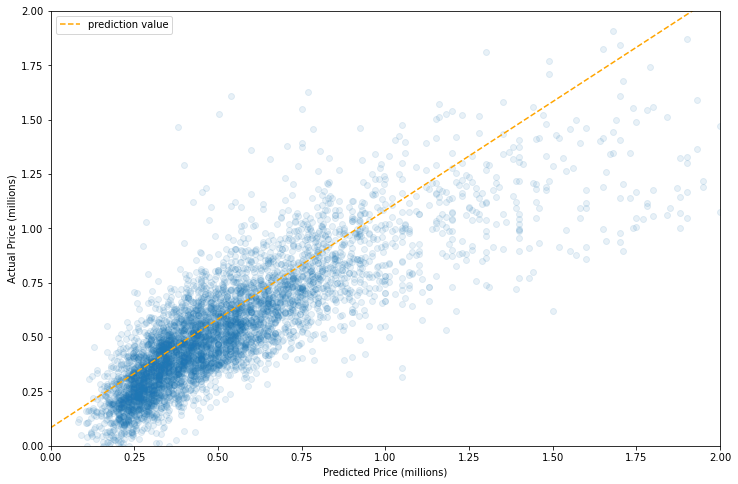

In [37]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots(figsize=(12,8))
perfect_line = np.arange(y_test.min()/1000000, y_test.max()/1000000)
ax.plot(perfect_line, linestyle="--", color="orange", label='prediction value')
ax.scatter(y_test/1000000, y_hat/1000000, alpha=0.1)
plt.xlim(0, 2)
plt.ylim(0, 2)
ax.set_xlabel("Predicted Price (millions)")
ax.set_ylabel("Actual Price (millions)")
ax.legend();

## Feature Engineering
    Create new variables to predict the price.

In [38]:
from haversine import haversine, Unit

seattle = (47.608013, -122.335167)
redmond = (47.673988, -122.121513)

def get_dist(center, lat, long):
    house = (lat, long)
    return haversine(center, house, unit=Unit.MILES)

In [39]:
def feature_engineering(data):
    feature_data = data.copy()

    # Add distance_from_seattle column
    feature_data['distance'] = data.apply(lambda x: get_dist(seattle, x.lat, x.long), axis=1)

    # Add distance_from_redmond column
    feature_data['dist_redmond'] = data.apply(lambda x: get_dist(redmond, x.lat, x.long), axis=1)
    
    feature_data['dist_major_cities'] = feature_data['distance'] + feature_data['dist_redmond']

    feature_data.drop(columns=['lat', 'long'], inplace=True)
    return feature_data

In [40]:
train_set = feature_engineering(train_set)
test_set = feature_engineering(test_set)

In [41]:
# Add population density to cities and zipcodes
population = pd.read_csv('data/population.csv')

pop_density = population.loc[:, ['City Name', 'Total Population 2010', 'Population Density (Persons / Square Mile) 2010']]
pop_density.rename(columns={'City Name':'city', 'Total Population 2010':'population', 'Population Density (Persons / Square Mile) 2010':'pop_density'}, inplace=True)

kc_city_towns = ['Algona', 'Auburn', 'Beaux Arts Village', 'Bellevue', 'Black Diamond', 'Bothell', 'Burien', 
                 'Carnation', 'Clyde Hill', 'Covington', 'Des Moines', 'Duvall', 'Enumclaw', 'Federal Way', 
                 'Hunts Point', 'Issaquah', 'Kenmore', 'Kent', 'Kirkland', 'Lake Forest Park', 'Maple Valley', 
                 'Medina', 'Mercer Island', 'Milton', 'Newcastle', 'Normandy Park', 'North Bend', 
                 'Pacific', 'Redmond', 'Renton', 'Sammamish', 'SeaTac', 'Seattle', 'Shoreline', 'Skykomish', 
                 'Snoqualmie', 'Tukwila', 'Woodinville', 'Yarrow Point']

city_names = pd.DataFrame(kc_city_towns, columns=['city'])

kc_population = pd.merge(pop_density, city_names, on=['city'])
kc_population = kc_population.append({'city':'Vashon','population':10624, 'pop_density':287.22}, ignore_index=True)

zipcodes = pd.read_csv('data/zipcodes.csv')
zipcodes['city'] = zipcodes['zipcode'].apply(lambda x: x.split('(')[1].strip('()'))
zipcodes['zipcode'] = zipcodes['zipcode'].apply(lambda x: int(x.split()[0]))

kc_zipcodes = pd.merge(kc_population, zipcodes, on=['city'])

pop_data_train = pd.merge(train_set, kc_zipcodes, how='inner', on=['zipcode'])
pop_data_test = pd.merge(test_set, kc_zipcodes, how='inner', on=['zipcode'])


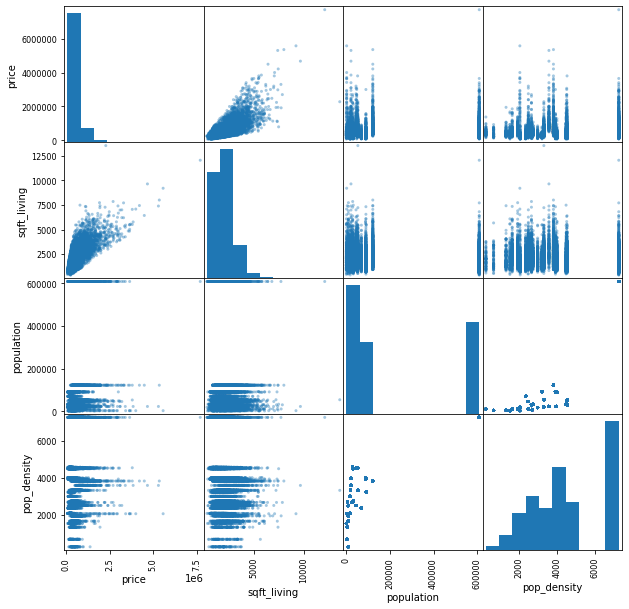

In [42]:
attributes = ['price', 'sqft_living', 'population', 'pop_density']

pd.plotting.scatter_matrix(pop_data_train[attributes], figsize = [10, 10], alpha=0.4);
plt.show()

In [43]:
train_set = only_numeric(pop_data_train)
test_set = only_numeric(pop_data_test)
y_train, X_train = get_y_X(train_set, 'price')

In [44]:
y_test, X_test = get_y_X(test_set, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.7323657932174282
 testing data R2: 0.7190648761655571                     
 training data rmse: 189516.65190883013
 testing data rmse: 196326.8133985465
Do you want a statsmodel summary of the train data? (y/n)


In [45]:
get_metrics(X_train, X_test, y_train, y_test)

(0.7323657932174282, 0.7190648761655571, 189516.65190883013, 196326.8133985465)

In [46]:
metric_table = update_metrics('Distance Data', X_train, X_test, y_train, y_test)
metric_table

,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832
1,Clean Data,0.704212,0.690775,199235.566210,205974.807626
2,Distance Data,0.732366,0.719065,189516.651909,196326.813399


## Polynomial

In [47]:
pl = PolynomialFeatures(2)

X_poly_train = pd.DataFrame(
            pl.fit_transform(train_set.drop('price', axis=1))
                      )

X_poly_test = pd.DataFrame(
            pl.transform(test_set.drop('price', axis=1))
                      )

y_poly_train = train_set.price
y_poly_test = test_set.price

In [48]:
train_set_poly = pd.concat([y_poly_train, X_poly_train], axis=1)
test_set_poly = pd.concat([y_poly_test, X_poly_test], axis=1)

In [49]:
y_train, X_train = get_y_X(train_set_poly, 'price')
y_test, X_test = get_y_X(test_set_poly, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.864167604741348
 testing data R2: 0.8510371563206207                     
 training data rmse: 135013.8260568003
 testing data rmse: 142960.34075222968
Do you want a statsmodel summary of the train data? (y/n)


In [50]:
get_metrics(X_train, X_test, y_train, y_test)

(0.864167604741348, 0.8510371563206207, 135013.8260568003, 142960.34075222968)

In [51]:
metric_table = update_metrics('Poly Data', X_train, X_test, y_train, y_test)
metric_table

,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832
1,Clean Data,0.704212,0.690775,199235.566210,205974.807626
2,Distance Data,0.732366,0.719065,189516.651909,196326.813399
3,Poly Data,0.864168,0.851037,135013.826057,142960.340752


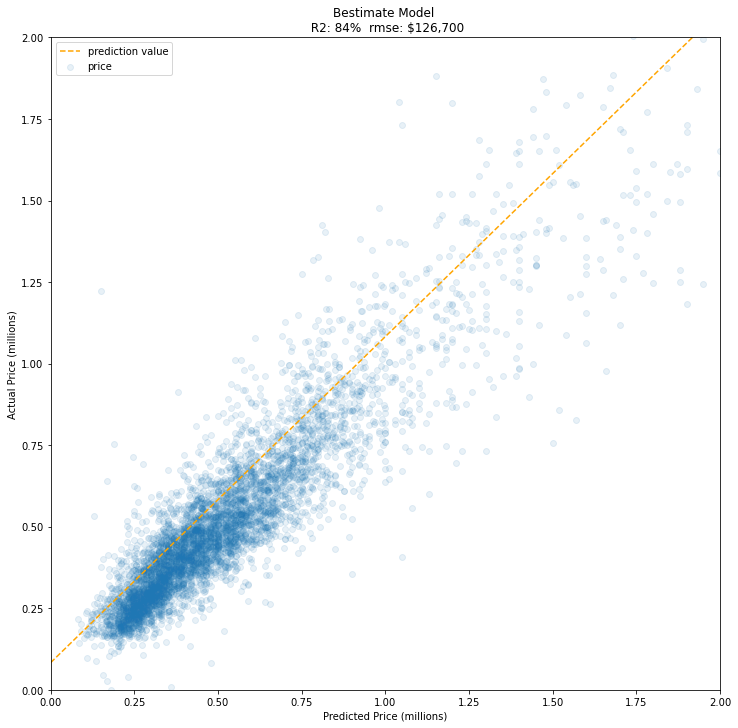

In [52]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots(figsize=(12,12))
perfect_line = np.arange(y_test.min()/1000000, y_test.max()/1000000)
ax.plot(perfect_line, linestyle="--", color="orange", label='prediction value')
plt.xlim(0, 2)
plt.ylim(0, 2)
ax.scatter(y_test/1000000, y_hat/1000000, alpha=0.1, label='price')
ax.set_xlabel("Predicted Price (millions)")
ax.set_ylabel("Actual Price (millions)")
ax.set_ylabel("Actual Price (millions)")
ax.set_title("Bestimate Model \n R2: 84%  rmse: $126,700")
ax.legend();

## Cut out homes over 3M

In [ ]:
# # Poly
# train_set_poly = train_set_poly[train_set_poly['price'] < 3000000]
# test_set_poly = test_set_poly[test_set_poly['price'] < 3000000]

In [ ]:
# y_train, X_train = get_y_X(train_set_poly, 'price')
# y_test, X_test = get_y_X(test_set_poly, 'price')
# train_test_compare(X_train, X_test, y_train, y_test)

In [ ]:
# get_metrics(X_train, X_test, y_train, y_test)

In [ ]:
# metric_table = update_metrics('Poly under 3M Data', X_train, X_test, y_train, y_test)
# metric_table

In [ ]:
# y_hat = lr.predict(X_test)

# fig, ax = plt.subplots(figsize=(12,12))
# perfect_line = np.arange(y_test.min()/1000000, y_test.max()/1000000)
# ax.plot(perfect_line, linestyle="--", color="orange", label='prediction value')
# ax.scatter(y_test/1000000, y_hat/1000000, alpha=0.1)
# plt.xlim(0, 3)
# plt.ylim(0, 3)
# ax.set_xlabel("Predicted Price (millions)")
# ax.set_ylabel("Actual Price (millions)")
# ax.legend();

## Data Transformation
    Perform log transformation and standardization.

In [53]:
# Log Transform
def log_transform(data):
    
    log_transform = ['sqft_living', 'sqft_lot', 'sqft_living15', 'sqft_lot15', 
                 'distance', 'dist_redmond', 'population', 'pop_density']
    log_data = data.copy()

    for col in log_transform:
        log_data[col] = np.log(log_data[col])
        
    return log_data

In [54]:
train_set = log_transform(train_set)
test_set = log_transform(test_set)

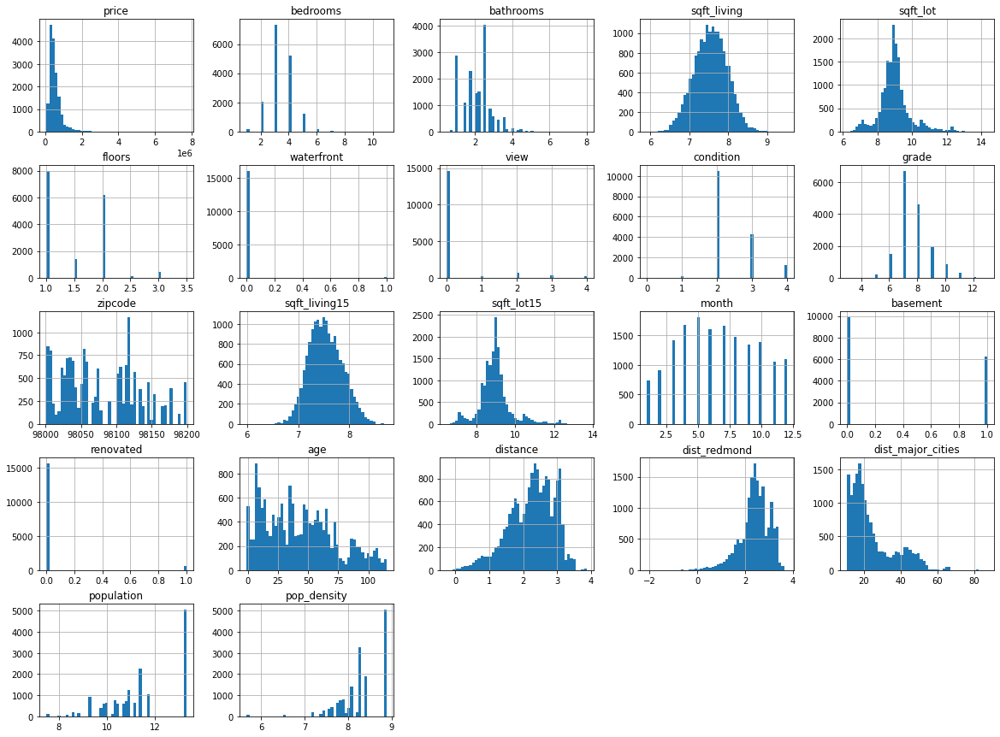

In [55]:
train_set.hist(bins=50, figsize=(20,15))
plt.show()

In [56]:
y_train, X_train = get_y_X(train_set, 'price')
y_test, X_test = get_y_X(test_set, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.7093045307835621
 testing data R2: 0.6807871534725187                     
 training data rmse: 197513.00500648073
 testing data rmse: 209274.72406215913
Do you want a statsmodel summary of the train data? (y/n)


In [57]:
get_metrics(X_train, X_test, y_train, y_test)

(0.7093045307835621,
 0.6807871534725187,
 197513.00500648073,
 209274.72406215913)

In [58]:
metric_table = update_metrics('Logarithmic Data', X_train, X_test, y_train, y_test)
metric_table

,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832
1,Clean Data,0.704212,0.690775,199235.566210,205974.807626
2,Distance Data,0.732366,0.719065,189516.651909,196326.813399
3,Poly Data,0.864168,0.851037,135013.826057,142960.340752
4,Logarithmic Data,0.709305,0.680787,197513.005006,209274.724062


## Drop sqft_lot15

In [ ]:
# train_set = train_set.drop('sqft_lot15', axis=1)
# test_set = test_set.drop('sqft_lot15', axis=1)

In [ ]:
# y_train, X_train = get_y_X(train_set, 'price')
# y_test, X_test = get_y_X(test_set, 'price')
# train_test_compare(X_train, X_test, y_train, y_test)

In [ ]:
# get_metrics(X_train, X_test, y_train, y_test)

In [ ]:
# metric_table = update_metrics('Drop sqft_lot15 Data', X_train, X_test, y_train, y_test)
# metric_table

### Feature Scaling and Standardization

In [59]:
# Only need numeric data
train_numeric = train_set.drop(columns=['price','waterfront', 'view', 'condition', 'grade', 'zipcode', 
                                        'month', 'basement', 'renovated'])
test_numeric = test_set.drop(columns=['price','waterfront', 'view', 'condition', 'grade', 'zipcode', 
                                        'month', 'basement', 'renovated'])

In [60]:
sc = StandardScaler()
train_scaled = pd.DataFrame(sc.fit_transform(train_numeric), 
                              columns = train_numeric.columns, index = train_numeric.index)

test_scaled = pd.DataFrame(sc.transform(test_numeric), 
                              columns = test_numeric.columns, index = test_numeric.index)

In [61]:
train_set = train_scaled.join(train_set[['price','waterfront', 'view', 'condition', 'grade', 'zipcode', 
                                        'month', 'basement', 'renovated']])
test_set = test_scaled.join(test_set[['price','waterfront', 'view', 'condition', 'grade', 'zipcode', 
                                        'month', 'basement', 'renovated']])

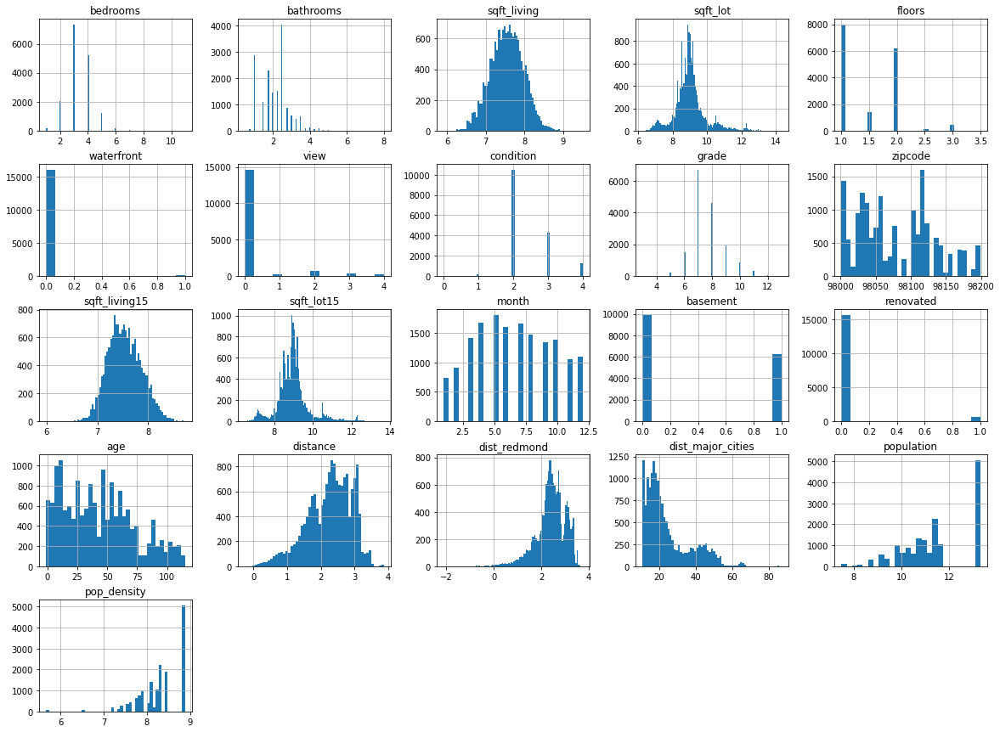

In [62]:
X_train.hist(bins='auto', figsize=(20,15))
plt.show()

In [63]:
y_train, X_train = get_y_X(train_set, 'price')
y_test, X_test = get_y_X(test_set, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.7093045307835648
 testing data R2: 0.680787153472521                     
 training data rmse: 197513.0050064798
 testing data rmse: 209274.72406215838
Do you want a statsmodel summary of the train data? (y/n)


In [64]:
get_metrics(X_train, X_test, y_train, y_test)

(0.7093045307835648, 0.680787153472521, 197513.0050064798, 209274.72406215838)

In [65]:
metric_table = update_metrics('Standardized Data', X_train, X_test, y_train, y_test)
metric_table

,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832
1,Clean Data,0.704212,0.690775,199235.566210,205974.807626
2,Distance Data,0.732366,0.719065,189516.651909,196326.813399
3,Poly Data,0.864168,0.851037,135013.826057,142960.340752
4,Logarithmic Data,0.709305,0.680787,197513.005006,209274.724062
5,Standardized Data,0.709305,0.680787,197513.005006,209274.724062


### Data with Categorical Variables

In [66]:
# Add back cities        
train_set_dumm = pd.concat([train_set, pop_data_train['city']], axis=1)
test_set_dumm = pd.concat([test_set, pop_data_test['city']], axis=1)

In [67]:
# Add Seasons
def bin_seasons(data):
    data['month'] = data['month'].replace(12, 0)

    bins = [0, 3, 6, 9, 11]
    data['season'] = pd.cut(data['month'], bins, include_lowest = True, labels = ['Winter', 
                                                                                      'Spring', 'Summer', 'Fall'])
    return data

In [68]:
train_set_dumm = bin_seasons(train_set_dumm)
test_set_dumm = bin_seasons(test_set_dumm)

In [69]:
# Get dummies
def get_dummies(data):
    zipcode_dummies = pd.get_dummies(data['zipcode'], drop_first=True)
    condition_dummies = pd.get_dummies(data['condition'], prefix='cond', drop_first=True)
    month_dummies = pd.get_dummies(data['month'], prefix='month',drop_first=True)
    city_dummies = pd.get_dummies(data['city'], drop_first=True)
    season_dummies = pd.get_dummies(data['season'], drop_first=True)

    dummy_data = pd.concat([data, zipcode_dummies, city_dummies, month_dummies, season_dummies], axis=1)
    
    dummy_data.drop(columns=['zipcode', 'condition', 'month', 'city', 'season'], inplace=True)
    return dummy_data

In [70]:
train_set_dumm = get_dummies(train_set_dumm)
test_set_dumm = get_dummies(test_set_dumm)

In [71]:
y_train, X_train = get_y_X(train_set_dumm, 'price')
y_test, X_test = get_y_X(test_set_dumm, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

 training data R2: 0.779437394375853
 testing data R2: 0.7536740243159995                     
 training data rmse: 172045.17877714479
 testing data rmse: 183836.48319186427
Do you want a statsmodel summary of the train data? (y/n)


In [72]:
get_metrics(X_train, X_test, y_train, y_test)

(0.779437394375853, 0.7536740243159995, 172045.17877714479, 183836.48319186427)

In [73]:
metric_table = update_metrics('Categorical Data', X_train, X_test, y_train, y_test)
metric_table


,model,train_rsquared,test_rsquared,train_rmse,test_rmse
0,Baseline Data,0.631975,0.618191,226292.826596,221129.324832
1,Clean Data,0.704212,0.690775,199235.566210,205974.807626
2,Distance Data,0.732366,0.719065,189516.651909,196326.813399
3,Poly Data,0.864168,0.851037,135013.826057,142960.340752
4,Logarithmic Data,0.709305,0.680787,197513.005006,209274.724062
5,Standardized Data,0.709305,0.680787,197513.005006,209274.724062
6,Categorical Data,0.779437,0.753674,172045.178777,183836.483192


In [74]:
metric_table_present = metric_table
%store metric_table_present

Stored 'metric_table_present' (DataFrame)


In [ ]:
%store -r metric_table_present

In [ ]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots()
perfect_line = np.arange(y_test.min(), y_test.max())
ax.plot(perfect_line, linestyle="--", color="orange", label='regression line')
ax.scatter(y_test, y_hat, alpha=0.5)
ax.set_xlabel("Prediction")
ax.set_ylabel("Actual Price")
ax.legend();

In [ ]:
# plt.bar(x=metric_table['model'], height=metric_table['rmse'])
# plt.xticks(rotation=45);

## Cat Data + Polynomial

In [ ]:
train_set_dumm.head()

In [ ]:
train_set_poly.head()

In [ ]:
poly_columns = list(train_set_dumm.columns)[:18]


In [ ]:
train_set.head()

In [ ]:
train_set_poly.head()

## Drop Seasons

In [ ]:
test_set = test_set.drop(['Spring', 'Summer', 'Fall'], axis=1)
train_set = train_set.drop(['Spring', 'Summer', 'Fall'], axis=1)

In [ ]:
y_train, X_train = get_y_X(train_set, 'price')
y_test, X_test = get_y_X(test_set, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

In [ ]:
get_metrics(y_train, X_train)

In [ ]:
metric_table = update_metrics('Drop Season Data', y_train, X_train)
metric_table

In [ ]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots()
perfect_line = np.arange(y_test.min(), y_test.max())
ax.plot(perfect_line, linestyle="--", color="orange", label='regression line')
ax.scatter(y_test, y_hat, alpha=0.2)
ax.set_xlabel("Prediction")
ax.set_ylabel("Actual Price")
ax.legend();

### Luxury Houses

In [ ]:
# Run linear regression on luxury houses
def luxury(data):
    luxury = data.loc[(data['grade'] >= 10)]
    return luxury

In [ ]:
train_set_luxury = luxury(train_set)
test_set_luxury = luxury(test_set)

In [ ]:
y_train, X_train = get_y_X(train_set_luxury, 'price')
y_test, X_test = get_y_X(test_set_luxury, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

In [ ]:
get_metrics(y_train, X_train)

In [ ]:
metric_table = update_metrics('Luxury Data', y_train, X_train)
metric_table

In [ ]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots()
perfect_line = np.arange(y_test.min(), y_test.max())
ax.plot(perfect_line, linestyle="--", color="orange", label='regression line')
ax.scatter(y_test, y_hat, alpha=0.5)
ax.set_xlabel("Prediction")
ax.set_ylabel("Actual Price")
ax.legend();

### Non-Luxury Houses

In [ ]:
# Run linear regression on feature engineered data
def non_luxury(data):
    non_luxury = data.loc[(data['grade'] < 10)]
    return non_luxury

In [ ]:
train_set_non_lux = non_luxury(train_set)
test_set_non_lux = non_luxury(test_set)

In [ ]:
y_train, X_train = get_y_X(train_set_non_lux, 'price')
y_test, X_test = get_y_X(test_set_non_lux, 'price')
train_test_compare(X_train, X_test, y_train, y_test)

In [ ]:
get_metrics(y_train, X_train)

In [ ]:
metric_table = update_metrics('Non-Luxury Data', y_train, X_train)
metric_table

In [ ]:
y_hat = lr.predict(X_test)

fig, ax = plt.subplots(figsize=(12,8))
perfect_line = np.arange(y_test.min(), y_test.max())
ax.plot(perfect_line, linestyle="--", color="orange", label='regression line')
ax.scatter(y_test, y_hat, alpha=0.2)
ax.set_xlabel("Prediction")
ax.set_ylabel("Actual Price")
ax.legend();

#### Check Assumptions of Linear Regression
    Linearity, independence, normality, homoescadicity

In [ ]:
# code

### Feature Selection
    Feature ranking with recursive feature elimination.

In [ ]:
def train_test(y, X):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=42)
    return X_train, X_test, y_train, y_test

In [ ]:
y_train, X_train = get_y_X(train_set_dumm, 'price')
y_test, X_test = get_y_X(test_set_dumm, 'price')

columns = list(X_train.columns)

rfe = RFE(lr, n_features_to_select = 5)             
X_train_rfe = rfe.fit_transform(X_train, y_train)  
lr.fit(X_train_rfe, y_train)

optimum = pd.Series(rfe.support_,index = columns)

selected_features_rfe = optimum[optimum == True].index
selected_features_rfe

In [ ]:
y, X = get_y_X(train_set_dumm, 'price')


features_list = np.arange(1,22)            
highest_score = 0
num_features = 0
score_list = []

for n in range(len(features_list)):
    X_train, X_test, y_train, y_test = train_test(y, X)
    rfe = RFE(lr, n_features_to_select = n+1)
    X_train_rfe = rfe.fit_transform(X_train, y_train)
    X_test_rfe = rfe.transform(X_test)
    lr.fit(X_train_rfe, y_train)
    
    score = lr.score(X_test_rfe, y_test)
    score_list.append(score)
    
    if(score > highest_score):
        highest_score = score
        num_features = features_list[n]
        
print(f'Optimum number of features: {num_features}')
print(f'Score with {num_features} features: {features_list, highest_score}')

### Cross Validation
    Perform k-fold cross validation.

In [ ]:
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import cross_val_score

mse = make_scorer(mean_squared_error)

cv_10_results = cross_val_score(lr, X, y, cv=10, scoring=mse)
np.sqrt(cv_10_results.mean())

In [ ]:
scores = cross_val_score(lr, X, y, cv=10, scoring='neg_mean_squared_error')
np.sqrt(-scores)